# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

In [2]:
#importing the csv file , which is created in previous use cases
review_dataset_filtered = pd.read_csv(r'C:/COMPUTER/E drive/AAIC (APPLIED AI COURSE)/Classification and Regression models/LOGISTIC REGRESSION/filtered_reviews_data.csv')

In [3]:
review_dataset_filtered.shape

(364173, 12)

In [4]:
#removing all the null value represnted rows (removing rows even if one column has na in entire 12 columns in given dataset)
review_dataset_filtered.dropna(inplace=True)

In [5]:
review_dataset_filtered.shape

(364158, 12)

#### As it is temporal data, I will be performing time-based splitting

In [6]:
#sorting the dataset according to time as we need time-based splitting
review_dataset_final_sorted = review_dataset_filtered.sort_values(by ='Time',axis=0,ascending=True,inplace=False,kind='quicksort')

In [7]:
review_dataset_final_sorted.head()

,Unnamed: 0,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Cleaned_text
117926,150523,150524,0006641040,ACITT7DI6IDDL,shari zychinski,0,0,positive,939340800,EVERY book is educational,this witty little book makes my son laugh at l...,witti littl book make son laugh loud recit car...
117903,150500,150501,0006641040,AJ46FKXOVC7NR,Nicholas A Mesiano,2,2,positive,940809600,This whole series is great way to spend time w...,I can remember seeing the show when it aired o...,rememb see show air televis year ago child sis...
298794,451855,451856,B00004CXX9,AIUWLEQ1ADEG5,Elizabeth Medina,0,0,positive,944092800,Entertainingl Funny!,Beetlejuice is a well written movie ..... ever...,beetlejuic well written movi everyth excel act...
169283,230284,230285,B00004RYGX,A344SMIA5JECGM,Vincent P. Ross,1,2,positive,944438400,A modern day fairy tale,"A twist of rumplestiskin captured on film, sta...",twist rumplestiskin captur film star michael k...
298793,451854,451855,B00004CXX9,AJH6LUC1UT1ON,The Phantom of the Opera,0,0,positive,946857600,FANTASTIC!,Beetlejuice is an excellent and funny movie. K...,beetlejuic excel funni movi keaton hilari wack...


In [10]:
labels = review_dataset_final_sorted['Score']

In [9]:
LABELS = labels.value_counts()

In [14]:
#using plotly express to find the count of each class
import plotly.express as px
px.histogram(review_dataset_final_sorted,review_dataset_final_sorted['Score'],color=review_dataset_final_sorted.Score,
            title="Distribution of positive and negative classes in original dataset")

In [15]:
print(f"POSITIVE class labels in original data is {round(((labels.value_counts()[0]/review_dataset_final_sorted.shape[0])*100),2)} %")
print(f"NEGATIVE class labels in original data is {round(((labels.value_counts()[1]/review_dataset_final_sorted.shape[0])*100),2)} %")

POSITIVE class labels in original data is 84.32 %
NEGATIVE class labels in original data is 15.68 %


In [16]:
#Now, let's take only 80k datapoints for computation because 300K+ would not be ideal to choose among
# WE ARE CHOOSING ONLY 80K because (if we consider more than them , then we might face computational issues)
review_dataset_final_sorted_sample = review_dataset_final_sorted.sample(n=80000)

In [17]:
#Now, let's make a check distribution of data or percentage of data present
sample_labels = review_dataset_final_sorted_sample['Score'] 

In [18]:
sample_labels.value_counts()

positive    67341
negative    12659
Name: Score, dtype: int64

In [19]:
px.histogram(review_dataset_final_sorted_sample,review_dataset_final_sorted_sample.Score,
             color=review_dataset_final_sorted_sample.Score,
            title="Distribution of positive and negative classes in sample dataset")

In [20]:
print(f"POSITIVE class labels in sample data is {round(((sample_labels.value_counts()[0]/review_dataset_final_sorted_sample.shape[0])*100),2)} %")
print(f"NEGATIVE class labels in sample data is {round(((sample_labels.value_counts()[1]/review_dataset_final_sorted_sample.shape[0])*100),2)} %")

POSITIVE class labels in sample data is 84.18 %
NEGATIVE class labels in sample data is 15.82 %


So, it is almost same as our original dataset. Now, we can proceed on with further operations

#### Actually it is reviews dataset. So,I think it is better if we perform time-based splitting rather than random split
So, we will sort it first and then divide the data in 80:20 ratio and from train we can divide cross validation data

In [21]:
#sorting the dataset according to time as we need time-based splitting
final_data = review_dataset_final_sorted_sample.sort_values(by ='Time',axis=0,ascending=True,inplace=False,kind='quicksort')

In [22]:
final_data.shape

(80000, 12)

So, 80000 will be train data and 20000 will be test data

In [23]:
train_data = final_data['Cleaned_text'][:64000]
test_data = final_data['Cleaned_text'][64000:]
train_data_labels = final_data['Score'][:64000]
test_data_labels = final_data['Score'][64000:]

In [24]:
test_data_labels.value_counts()

positive    13251
negative     2749
Name: Score, dtype: int64

In [31]:
#TRAIN DATA
print(f"positive labels distribution for TRAIN data {round((train_data_labels.value_counts()[0]/train_data_labels.shape[0])*100,2)}")
print(f"negative labels distribution for TRAIN data {round((train_data_labels.value_counts()[1]/train_data_labels.shape[0])*100,2)}")

positive labels distribution for TRAIN data 84.52
negative labels distribution for TRAIN data 15.48


In [42]:
px.histogram(train_data_labels.index,train_data_labels.values,color=list(train_data_labels),
            title="Count of each class variable in TRAIN data ")

In [43]:
#TEST DATA
print(f"positive labels distribution for TEST data {round((test_data_labels.value_counts()[0]/test_data_labels.shape[0])*100,2)}")
print(f"negative labels distribution for TEST data {round((test_data_labels.value_counts()[1]/test_data_labels.shape[0])*100,2)}")

positive labels distribution for TEST data 82.82
negative labels distribution for TEST data 17.18


In [45]:
px.histogram(test_data_labels.index,test_data_labels.values,color=list(test_data_labels),
            title="Count of each class variable in TEST data ")

So, as we can see that there is slight variation in both distributions but it is fine to some extent

# [5] Assignment 8: Decision Trees

<ol>
    <li><strong>Apply Decision Trees on these feature sets</strong>
        <ul>
            <li><font color='red'>SET 1:</font>Review text, preprocessed one converted into vectors using (BOW)</li>
            <li><font color='red'>SET 2:</font>Review text, preprocessed one converted into vectors using (TFIDF)</li>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
        </ul>
    </li>
    <br>
    <li><strong>The hyper paramter tuning (best `depth` in range [1, 5, 10, 50, 100, 500, 100], and the best `min_samples_split` in range [5, 10, 100, 500])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>Find the best hyper paramter using k-fold cross validation or simple cross validation data</li>
    <li>Use gridsearch cv or randomsearch cv or you can also write your own for loops to do this task of hyperparameter tuning</li>          
        </ul>
    </li>
    <br>
    <li><strong>Graphviz</strong>
        <ul>
    <li>Visualize your decision tree with Graphviz. It helps you to understand how a decision is being made, given a new vector.</li>
    <li>Since feature names are not obtained from word2vec related models, visualize only BOW & TFIDF decision trees using Graphviz</li>
    <li>Make sure to print the words in each node of the decision tree instead of printing its index.</li>
    <li>Just for visualization purpose, limit max_depth to 2 or 3 and either embed the generated images of graphviz in your notebook, or directly upload them as .png files.</li>                
        </ul>
    </li>
    <br>
    <li><strong>Feature importance</strong>
        <ul>
    <li>Find the top 20 important features from both feature sets <font color='red'>Set 1</font> and <font color='red'>Set 2</font> using `feature_importances_` method of <a href='https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html'>Decision Tree Classifier</a> and print their corresponding feature names</li>
        </ul>
    </li>
    <br>
    <li><strong>Feature engineering</strong>
        <ul>
    <li>To increase the performance of your model, you can also experiment with with feature engineering like :</li>
            <ul>
            <li>Taking length of reviews as another feature.</li>
            <li>Considering some features from review summary as well.</li>
        </ul>
        </ul>
    </li>
    <br>
    <li><strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure.
    <img src='train_cv_auc.JPG' width=300px></li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='train_test_auc.JPG' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points. Please visualize your confusion matrices using <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heatmaps.
    <img src='confusion_matrix.png' width=300px></li>
        </ul>
    </li>
    <br>
    <li><strong>Conclusion</strong>
        <ul>
    <li>You need to summarize the results at the end of the notebook, summarize it in the table format. To print out a table please refer to this prettytable library<a href='http://zetcode.com/python/prettytable/'>  link</a> 
        <img src='summary.JPG' width=400px>
    </li>
        </ul>
</ol>

<h4><font color='red'>Note: Data Leakage</font></h4>

1. There will be an issue of data-leakage if you vectorize the entire data and then split it into train/cv/test.
2. To avoid the issue of data-leakag, make sure to split your data first and then vectorize it. 
3. While vectorizing your data, apply the method fit_transform() on you train data, and apply the method transform() on cv/test data.
4. For more details please go through this <a href='https://soundcloud.com/applied-ai-course/leakage-bow-and-tfidf'>link.</a>

# Applying Decision Trees

In [46]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

#for visualization
import graphviz
from sklearn import tree

## [5.1] Applying Decision Trees on BOW,<font color='red'> SET 1</font>

In [47]:
#Initially applying BOW on train data and then will apply BOW on test data
#BoW on train data
count_vect = CountVectorizer(min_df=25) #selecting terms which has frequency higher than 50
bow_train_data = count_vect.fit_transform(train_data)
print("some feature names ", count_vect.get_feature_names()[:10])
print('='*50)
print("the type of count vectorizer ",type(bow_train_data))
print("the shape of out text BOW vectorizer ",bow_train_data.get_shape())
print("the number of unique words ", bow_train_data.get_shape()[1])

some feature names  ['abil', 'abl', 'absolut', 'absorb', 'absurd', 'abund', 'acai', 'accent', 'accept', 'access']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (64000, 4418)
the number of unique words  4418


In [48]:
tuned_parameters = [{'max_depth': [1, 5, 10, 50, 100, 500, 1000],'min_samples_split':[5, 10, 100, 500]}] 

#using GridSearchCV
model = GridSearchCV(DecisionTreeClassifier(),tuned_parameters,scoring='roc_auc',cv=3)
model.fit(bow_train_data,train_data_labels.values)

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid=[{'max_depth': [1, 5, 10, 50, 100, 500, 1000],
                          'min_samples_split': [5, 10, 100, 500]}

In [49]:
model.best_estimator_

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=50,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [55]:
#https://stackoverflow.com/questions/38692520/what-is-the-difference-between-fit-transform-and-transform-in-sklearn-countvecto
bow_test_data = count_vect.transform(test_data)

In [56]:
decision_tree_model = DecisionTreeClassifier(max_depth=model.best_params_['max_depth'],min_samples_split=model.best_params_['min_samples_split'])

In [57]:
decision_tree_model.fit(bow_train_data,train_data_labels.values)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=50,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [58]:
print(f"Train AUC score is {round(decision_tree_model.score(bow_train_data,train_data_labels.values)*100,2)}%") #Test accuracy

Train AUC score is 88.69%


In [59]:
print(f"Test AUC score is {round(decision_tree_model.score(bow_test_data, test_data_labels.values)*100,2)}%") #Test accuracy

Test AUC score is 85.44%


In [60]:
predictions = decision_tree_model.predict(bow_test_data)
prediction_probability_test = decision_tree_model.predict_proba(bow_test_data)
prediction_probability_train = decision_tree_model.predict_proba(bow_train_data)

In [66]:
predictions

array(['positive', 'positive', 'positive', ..., 'positive', 'positive',
       'positive'], dtype=object)

In [65]:
prediction_probability_test

array([[0.24324324, 0.75675676],
       [0.02750353, 0.97249647],
       [0.01292705, 0.98707295],
       ...,
       [0.05506217, 0.94493783],
       [0.01979695, 0.98020305],
       [0.01930139, 0.98069861]])

In [74]:
#code for drawing heatmaps (confusion matrix)
heatmap_dataframe = pd.DataFrame(confusion_matrix(test_data_labels.values,predictions,labels=['negative','positive']), columns=['negative','positive'],index=['negative','positive'])

In [75]:
heatmap_dataframe

,negative,positive
negative,1114,1635
positive,694,12557


In [80]:
true_negative, false_positive, false_negative, true_positive = confusion_matrix(test_data_labels.values,predictions).ravel()

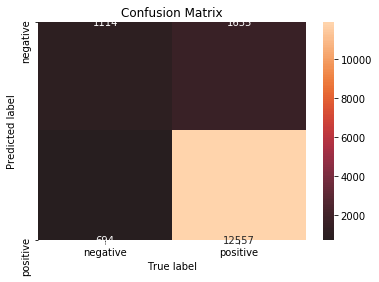

In [102]:
heatmap = sns.heatmap(heatmap_dataframe,annot=True,fmt='d',center=True,robust=True)
# Setting tick labels for heatmap
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.title("Confusion Matrix")
plt.show()

In [111]:
#prediction_probability_train[:,1]--considering only probabilities for positive class (As ROC is calculated only based on +ve)
fpr_train, tpr_train, threshold_train = roc_curve(train_data_labels, prediction_probability_train [:,1],pos_label='positive')
fpr_test, tpr_test, threshold_test = roc_curve(test_data_labels, prediction_probability_test[:,1],pos_label='positive')


In [112]:
print(f"The AUC value for test data is {roc_auc_score(train_data_labels, prediction_probability_train[:,1])}")

The AUC value for test data is 0.887954356820928


In [126]:
#creating a dataframe for all fpr_train and tpr_train
roc_auc_train_df = pd.DataFrame(dict(fpr_train=fpr_train,tpr_train=tpr_train))
#creating a dataframe for all fpr_test and tpr_test
roc_auc_test_df = pd.DataFrame(dict(fpr_test=fpr_test,tpr_test=tpr_test))

In [147]:
train_roc = px.line(roc_auc_train_df,roc_auc_train_df.fpr_train,roc_auc_train_df.tpr_train,title="ROC curve for TRAIN data")
train_roc.data[0].update(mode="markers+lines")
train_roc

In [148]:
print(f"The AUC value for test data is {roc_auc_score(test_data_labels, prediction_probability_test[:,1])}")

The AUC value for test data is 0.8210993170203233


In [149]:
test_roc = px.line(roc_auc_test_df,roc_auc_test_df.fpr_test,roc_auc_test_df.tpr_test,title="ROC curve for TEST data")
test_roc.data[0].update(mode="markers+lines")
test_roc

### [5.1.1] Top 20 important features from<font color='red'> SET 1</font>

In [150]:
len(decision_tree_model.feature_importances_)

4418

In [155]:
#The abs() function is used to return the absolute value of a number4
#https://www.geeksforgeeks.org/python-map-function/

bottom_20_values = np.array(list(map(abs,decision_tree_model.feature_importances_))).argsort()[0:10]
top_20_values = np.array(list(map(abs,decision_tree_model.feature_importances_))).argsort()[4398:4418]

In [156]:
bottom_features={}
top_features={}
for index in bottom_20_values:
    for each in count_vect.vocabulary_:
        if count_vect.vocabulary_[each] == index:
            bottom_features[each]=decision_tree_model.feature_importances_[index]
            
for index in top_20_values:
    for each in count_vect.vocabulary_:
        if count_vect.vocabulary_[each] == index:
            top_features[each]=decision_tree_model.feature_importances_[index]

In [157]:
bottom_features

{'abil': 0.0,
 'pillow': 0.0,
 'pin': 0.0,
 'pina': 0.0,
 'pinch': 0.0,
 'pine': 0.0,
 'pineappl': 0.0,
 'pink': 0.0,
 'pint': 0.0,
 'pinto': 0.0}

In [158]:
top_features

{'thought': 0.010295480981345253,
 'excel': 0.011093335786911334,
 'descript': 0.012016944600461607,
 'favorit': 0.012172541001824928,
 'threw': 0.013063993566481006,
 'stale': 0.014107987311689538,
 'good': 0.01671530192308323,
 'money': 0.01722188017861955,
 'perfect': 0.018056864523327488,
 'terribl': 0.024709029485033146,
 'horribl': 0.02487023594433146,
 'delici': 0.025610225393783374,
 'aw': 0.031794891808950156,
 'best': 0.03363028244356765,
 'love': 0.04047062059639455,
 'wast': 0.043890037468735404,
 'return': 0.04860962354623005,
 'great': 0.048885315998966165,
 'worst': 0.0509907967590961,
 'disappoint': 0.10566623340813575}

In [251]:
model = DecisionTreeClassifier(min_samples_split=500,max_depth=50)
model.fit(bow_train_data,train_data_labels.values)


DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=50,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [260]:
importances = model.feature_importances_

In [274]:
#https://chrisalbon.com/machine_learning/trees_and_forests/feature_importance/

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

#indices only for 10
indices_20 = indices[:10]

# Rearrange feature names so they match the sorted feature importances
names = [count_vect.get_feature_names()[i] for i in indices_20]

#create a dataframe for important features and it's corresponding values
feature_importance_df = pd.DataFrame({"feature_name":names,"value":importances[indices_20]})

#now create a plot
px.bar(feature_importance_df,feature_importance_df['feature_name'],feature_importance_df['value'],color=feature_importance_df['feature_name'],title="Feature Importance Plot")


In [276]:
list(feature_importance_df['feature_name'])

['disappoint',
 'worst',
 'great',
 'return',
 'wast',
 'love',
 'best',
 'aw',
 'delici',
 'horribl']

### [5.1.2] Graphviz visualization of Decision Tree on BOW,<font color='red'> SET 1</font>

In [159]:
import os
os.environ["PATH"] += os.pathsep + r'C:/Program Files (x86)/Graphviz2.38/bin/'

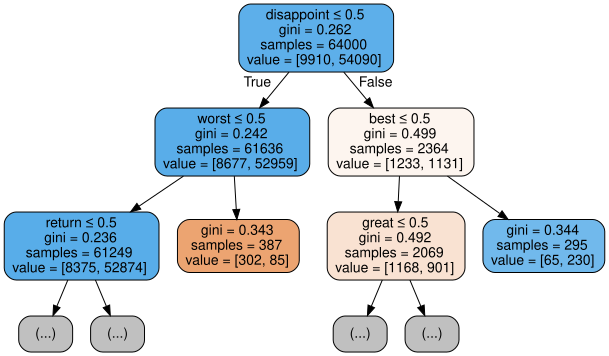

In [160]:
# https://www.datacamp.com/community/tutorials/decision-tree-classification-python
vocabulary = count_vect.vocabulary_

val=list(vocabulary.values())
indexes = np.array(val).argsort()

words=list(vocabulary.keys())
sorted_words=[]
for each in indexes:
    sorted_words.append(words[each])
    
dot_data = tree.export_graphviz(decision_tree_model, out_file=None,max_depth=2,  
                         filled=True, rounded=True,feature_names=sorted_words,
                         special_characters=True)  
graph = graphviz.Source(dot_data) 
graph


## [5.2] Applying Decision Trees on TFIDF,<font color='red'> SET 2</font>

In [161]:
tf_idf_vectorizer = TfidfVectorizer(ngram_range=(1,2),min_df=50)
tf_idf_train_data = tf_idf_vectorizer.fit_transform(train_data)
print("some sample features(unique words in the corpus)",tf_idf_vectorizer.get_feature_names()[0:10])
print('='*50)
print("the type of count vectorizer ",type(tf_idf_train_data))
print("the shape of out text TFIDF vectorizer ",tf_idf_train_data.get_shape())
print("the number of unique words including both unigrams and bigrams ", tf_idf_train_data.get_shape()[1])

some sample features(unique words in the corpus) ['abil', 'abl', 'abl buy', 'abl eat', 'abl find', 'abl get', 'abl make', 'abl order', 'abl purchas', 'abl use']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text TFIDF vectorizer  (64000, 6732)
the number of unique words including both unigrams and bigrams  6732


In [162]:
tf_idf_test_data = tf_idf_vectorizer.transform(test_data)

In [163]:
tuned_parameters = [{'max_depth': [1, 5, 10, 50, 100, 500, 1000],'min_samples_split':[5, 10, 100, 500]}] 

#using GridSearchCV
model = GridSearchCV(DecisionTreeClassifier(),tuned_parameters,scoring='roc_auc',cv=3)
model.fit(tf_idf_train_data,train_data_labels.values)

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid=[{'max_depth': [1, 5, 10, 50, 100, 500, 1000],
                          'min_samples_split': [5, 10, 100, 500]}

In [164]:
model.best_estimator_

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=50,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [165]:
decision_tree_model = DecisionTreeClassifier(max_depth=model.best_params_['max_depth'],min_samples_split=model.best_params_['min_samples_split'])

In [166]:
decision_tree_model.fit(tf_idf_train_data,train_data_labels.values)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=50,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [167]:
print(f"Train AUC score is {round(decision_tree_model.score(tf_idf_train_data,train_data_labels.values)*100,2)}%") #Test accuracy

Train AUC score is 90.03%


In [168]:
print(f"Test AUC score is {round(decision_tree_model.score(tf_idf_test_data, test_data_labels.values)*100,2)}%") #Test accuracy

Test AUC score is 85.28%


In [169]:
predictions = decision_tree_model.predict(tf_idf_test_data)
prediction_probability_test = decision_tree_model.predict_proba(tf_idf_test_data)
prediction_probability_train = decision_tree_model.predict_proba(tf_idf_train_data)

In [170]:
predictions

array(['positive', 'positive', 'positive', ..., 'positive', 'negative',
       'positive'], dtype=object)

In [171]:
prediction_probability_test

array([[0.275     , 0.725     ],
       [0.02846402, 0.97153598],
       [0.01362179, 0.98637821],
       ...,
       [0.02846402, 0.97153598],
       [1.        , 0.        ],
       [0.01867093, 0.98132907]])

In [172]:
#code for drawing heatmaps (confusion matrix)
heatmap_dataframe = pd.DataFrame(confusion_matrix(test_data_labels.values,predictions,labels=['negative','positive']), columns=['negative','positive'],index=['negative','positive'])

In [173]:
heatmap_dataframe

,negative,positive
negative,1168,1581
positive,775,12476


In [174]:
true_negative, false_positive, false_negative, true_positive = confusion_matrix(test_data_labels.values,predictions).ravel()

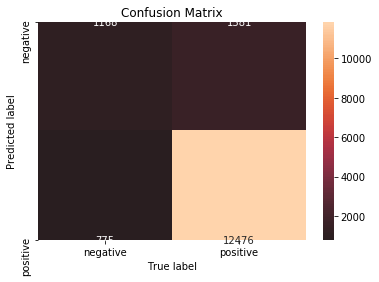

In [175]:
heatmap = sns.heatmap(heatmap_dataframe,annot=True,fmt='d',center=True,robust=True)
# Setting tick labels for heatmap
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.title("Confusion Matrix")
plt.show()

In [176]:
#prediction_probability_train[:,1]--considering only probabilities for positive class (As ROC is calculated only based on +ve)
fpr_train, tpr_train, threshold_train = roc_curve(train_data_labels, prediction_probability_train [:,1],pos_label='positive')
fpr_test, tpr_test, threshold_test = roc_curve(test_data_labels, prediction_probability_test[:,1],pos_label='positive')


In [177]:
print(f"The AUC value for test data is {roc_auc_score(train_data_labels, prediction_probability_train[:,1])}")

The AUC value for test data is 0.9032634596933502


In [178]:
#creating a dataframe for all fpr_train and tpr_train
roc_auc_train_df = pd.DataFrame(dict(fpr_train=fpr_train,tpr_train=tpr_train))
#creating a dataframe for all fpr_test and tpr_test
roc_auc_test_df = pd.DataFrame(dict(fpr_test=fpr_test,tpr_test=tpr_test))

In [179]:
train_roc = px.line(roc_auc_train_df,roc_auc_train_df.fpr_train,roc_auc_train_df.tpr_train,title="ROC curve for TRAIN data")
train_roc.data[0].update(mode="markers+lines")
train_roc

In [180]:
print(f"The AUC value for test data is {roc_auc_score(test_data_labels, prediction_probability_test[:,1])}")

The AUC value for test data is 0.8222339287406024


In [181]:
test_roc = px.line(roc_auc_test_df,roc_auc_test_df.fpr_test,roc_auc_test_df.tpr_test,title="ROC curve for TEST data")
test_roc.data[0].update(mode="markers+lines")
test_roc

### [5.1.1] Top 20 important features from<font color='red'> SET 2</font>

In [182]:
len(decision_tree_model.feature_importances_)

6732

In [189]:
#The abs() function is used to return the absolute value of a number4
#https://www.geeksforgeeks.org/python-map-function/

bottom_20_values = np.array(list(map(abs,decision_tree_model.feature_importances_))).argsort()[0:10]
top_20_values = np.array(list(map(abs,decision_tree_model.feature_importances_))).argsort()[6712:6732]

In [190]:
bottom_features={}
top_features={}
for index in bottom_20_values:
    for each in count_vect.vocabulary_:
        if count_vect.vocabulary_[each] == index:
            bottom_features[each]=decision_tree_model.feature_importances_[index]
            
for index in top_20_values:
    for each in count_vect.vocabulary_:
        if count_vect.vocabulary_[each] == index:
            top_features[each]=decision_tree_model.feature_importances_[index]

In [191]:
bottom_features

{'abil': 0.0,
 'ziplock': 0.0,
 'ziploc': 0.0,
 'zip': 0.0,
 'zinger': 0.0,
 'zing': 0.0,
 'zinc': 0.0,
 'zico': 0.0,
 'zevia': 0.0,
 'zesti': 0.0}

In [192]:
top_features

{'histori': 0.01095168432139584,
 'fatti': 0.011670310741630146,
 'influenc': 0.011781299767596712,
 'wish': 0.016081987259578726,
 'mouth': 0.016484242302107318,
 'fajita': 0.02318988603723161,
 'plaqu': 0.02395452410550502,
 'broil': 0.02829711686925696,
 'biggest': 0.03011810122887285,
 'sky': 0.0364425662340019,
 'nylabon': 0.04341748622147943,
 'flaxse': 0.09229564337945367}

### [5.1.2] Graphviz visualization of Decision Tree on tf-idf,<font color='red'> SET 2</font>

In [193]:
import os
os.environ["PATH"] += os.pathsep + r'C:/Program Files (x86)/Graphviz2.38/bin/'

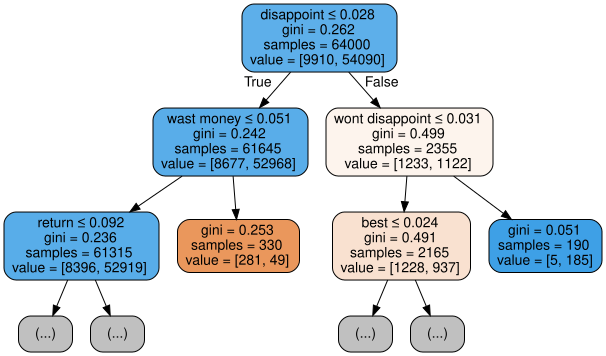

In [195]:
# https://www.datacamp.com/community/tutorials/decision-tree-classification-python
vocabulary = tf_idf_vectorizer.vocabulary_

val=list(vocabulary.values())
indexes = np.array(val).argsort()

words=list(vocabulary.keys())
sorted_words=[]
for each in indexes:
    sorted_words.append(words[each])
    
dot_data = tree.export_graphviz(decision_tree_model, out_file=None,max_depth=2,  
                         filled=True, rounded=True,feature_names=sorted_words,
                         special_characters=True)  
graph = graphviz.Source(dot_data) 
graph


## [5.3] Applying Decision Trees on AVG W2V,<font color='red'> SET 3</font>

In [196]:
# Train your own Word2Vec model using your own text corpus with train_data
list_of_sentences_train=[]
for sentance in train_data:
    list_of_sentences_train.append(sentance.split())

In [197]:
#training W2V using test data
list_of_sentences_test=[]
for sentance in test_data:
    list_of_sentences_test.append(sentance.split())

In [199]:
# Train your own Word2Vec model using your own text corpus with train_data with min_count = 5
w2v_model=Word2Vec(list_of_sentences_train,min_count=5,size=50, workers=4)

w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))

number of words that occured minimum 5 times  10451


In [200]:
#computing avgW2V for train data (for each review)
train_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentences_train): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    train_vectors.append(sent_vec)


100%|███████████████████████████████████████████████████████████████████████████| 64000/64000 [02:06<00:00, 506.97it/s]


In [201]:
#computing avgW2V for train data (for each review)
test_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentences_test): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    test_vectors.append(sent_vec)


100%|███████████████████████████████████████████████████████████████████████████| 16000/16000 [00:32<00:00, 486.41it/s]


In [202]:
# Data-preprocessing: Standardizing the data , We can even proceed without standardizing but if we standardize our data then whole values will be in same range.So, we are doing it
from sklearn.preprocessing import StandardScaler
standardization = StandardScaler()
train_vector_standardized =standardization.fit_transform(train_vectors)
test_vector_standardized = standardization.transform(test_vectors)

In [203]:
tuned_parameters = [{'max_depth': [1, 5, 10, 50, 100, 500, 1000],'min_samples_split':[5, 10, 100, 500]}] 

#using GridSearchCV
model = GridSearchCV(DecisionTreeClassifier(),tuned_parameters,scoring='roc_auc',cv=3)
model.fit(train_vector_standardized,train_data_labels.values)

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid=[{'max_depth': [1, 5, 10, 50, 100, 500, 1000],
                          'min_samples_split': [5, 10, 100, 500]}

In [204]:
model.best_estimator_

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [205]:
decision_tree_model = DecisionTreeClassifier(max_depth=model.best_params_['max_depth'],min_samples_split=model.best_params_['min_samples_split'])

In [206]:
decision_tree_model.fit(train_vector_standardized,train_data_labels.values)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [207]:
print(f"Train AUC score is {round(decision_tree_model.score(train_vector_standardized,train_data_labels.values)*100,2)}%") #Test accuracy

Train AUC score is 86.92%


In [208]:
print(f"Test AUC score is {round(decision_tree_model.score(test_vector_standardized, test_data_labels.values)*100,2)}%") #Test accuracy

Test AUC score is 84.46%


In [210]:
predictions = decision_tree_model.predict(test_vector_standardized)
prediction_probability_test = decision_tree_model.predict_proba(test_vector_standardized)
prediction_probability_train = decision_tree_model.predict_proba(train_vector_standardized)

In [211]:
predictions

array(['positive', 'positive', 'positive', ..., 'positive', 'positive',
       'positive'], dtype=object)

In [212]:
prediction_probability_test

array([[0.016412  , 0.983588  ],
       [0.31465517, 0.68534483],
       [0.03252033, 0.96747967],
       ...,
       [0.06395349, 0.93604651],
       [0.1969112 , 0.8030888 ],
       [0.02503414, 0.97496586]])

In [213]:
#code for drawing heatmaps (confusion matrix)
heatmap_dataframe = pd.DataFrame(confusion_matrix(test_data_labels.values,predictions,labels=['negative','positive']), columns=['negative','positive'],index=['negative','positive'])

In [214]:
heatmap_dataframe

,negative,positive
negative,784,1965
positive,521,12730


In [215]:
true_negative, false_positive, false_negative, true_positive = confusion_matrix(test_data_labels.values,predictions).ravel()

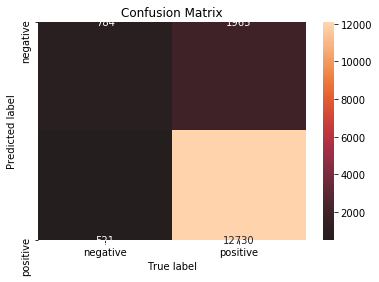

In [216]:
heatmap = sns.heatmap(heatmap_dataframe,annot=True,fmt='d',center=True,robust=True)
# Setting tick labels for heatmap
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.title("Confusion Matrix")
plt.show()

In [218]:
#prediction_probability_train[:,1]--considering only probabilities for positive class (As ROC is calculated only based on +ve)
fpr_train, tpr_train, threshold_train = roc_curve(train_data_labels, prediction_probability_train [:,1],pos_label='positive')
fpr_test, tpr_test, threshold_test = roc_curve(test_data_labels, prediction_probability_test[:,1],pos_label='positive')


In [219]:
print(f"The AUC value for train data is {roc_auc_score(train_data_labels, prediction_probability_train[:,1])}")

The AUC value for train data is 0.856807352323621


In [220]:
#creating a dataframe for all fpr_train and tpr_train
roc_auc_train_df = pd.DataFrame(dict(fpr_train=fpr_train,tpr_train=tpr_train))
#creating a dataframe for all fpr_test and tpr_test
roc_auc_test_df = pd.DataFrame(dict(fpr_test=fpr_test,tpr_test=tpr_test))

In [221]:
train_roc = px.line(roc_auc_train_df,roc_auc_train_df.fpr_train,roc_auc_train_df.tpr_train,title="ROC curve for TRAIN data")
train_roc.data[0].update(mode="markers+lines")
train_roc

In [222]:
print(f"The AUC value for test data is {roc_auc_score(test_data_labels, prediction_probability_test[:,1])}")

The AUC value for test data is 0.8095326216688891


In [223]:
test_roc = px.line(roc_auc_test_df,roc_auc_test_df.fpr_test,roc_auc_test_df.tpr_test,title="ROC curve for TEST data")
test_roc.data[0].update(mode="markers+lines")
test_roc

## [5.4] Applying Decision Trees on TFIDF W2V,<font color='red'> SET 4</font>

In [224]:
#I am using tfidf_train and test which is already done in previous steps and also using Only Word2Vec from previous one
dictionary = dict(zip(tf_idf_vectorizer.get_feature_names(), list(tf_idf_vectorizer.idf_)))
tfidf_features = tf_idf_vectorizer.get_feature_names()
tfidf_sent_train = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sentences_train): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_features:
            vec = w2v_model.wv[word]
            #  tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_train.append(sent_vec)
    row += 1

100%|███████████████████████████████████████████████████████████████████████████| 64000/64000 [09:16<00:00, 114.91it/s]


In [225]:
#test-data (for test data)
dictionary = dict(zip(tf_idf_vectorizer.get_feature_names(), list(tf_idf_vectorizer.idf_)))
tfidf_features = tf_idf_vectorizer.get_feature_names()
tfidf_sent_test = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sentences_test): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_features:
            vec = w2v_model.wv[word]
            #  tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_test.append(sent_vec)
    row += 1

100%|████████████████████████████████████████████████████████████████████████████| 16000/16000 [02:56<00:00, 90.74it/s]


In [226]:
# Data-preprocessing: Standardizing the data , We can even proceed without standardizing but if we standardize our data then whole values will be in same range.So, we are doing it
from sklearn.preprocessing import StandardScaler
standardization = StandardScaler()
tfidf_sent_train_standardized =standardization.fit_transform(tfidf_sent_train)
tfidf_sent_test_standardized = standardization.transform(tfidf_sent_test)

In [227]:
tuned_parameters = [{'max_depth': [1, 5, 10, 50, 100, 500, 1000],'min_samples_split':[5, 10, 100, 500]}] 

#using GridSearchCV
model = GridSearchCV(DecisionTreeClassifier(),tuned_parameters,scoring='roc_auc',cv=3)
model.fit(tfidf_sent_train_standardized,train_data_labels.values)

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid=[{'max_depth': [1, 5, 10, 50, 100, 500, 1000],
                          'min_samples_split': [5, 10, 100, 500]}

In [228]:
model.best_estimator_

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [229]:
decision_tree_model = DecisionTreeClassifier(max_depth=model.best_params_['max_depth'],min_samples_split=model.best_params_['min_samples_split'])

In [230]:
decision_tree_model.fit(tfidf_sent_train_standardized,train_data_labels.values)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [231]:
print(f"Train AUC score is {round(decision_tree_model.score(tfidf_sent_train_standardized,train_data_labels.values)*100,2)}%") #Train ROC

Train AUC score is 86.2%


In [232]:
print(f"Test AUC score is {round(decision_tree_model.score(tfidf_sent_test_standardized, test_data_labels.values)*100,2)}%") #Test accuracy

Test AUC score is 84.12%


In [233]:
predictions = decision_tree_model.predict(tfidf_sent_test_standardized)
prediction_probability_test = decision_tree_model.predict_proba(tfidf_sent_test_standardized)
prediction_probability_train = decision_tree_model.predict_proba(tfidf_sent_train_standardized)

In [234]:
predictions

array(['positive', 'positive', 'positive', ..., 'positive', 'positive',
       'positive'], dtype=object)

In [235]:
prediction_probability_test

array([[0.02040816, 0.97959184],
       [0.1670282 , 0.8329718 ],
       [0.06030151, 0.93969849],
       ...,
       [0.01779829, 0.98220171],
       [0.44604317, 0.55395683],
       [0.026097  , 0.973903  ]])

In [236]:
#code for drawing heatmaps (confusion matrix)
heatmap_dataframe = pd.DataFrame(confusion_matrix(test_data_labels.values,predictions,labels=['negative','positive']), columns=['negative','positive'],index=['negative','positive'])

In [237]:
heatmap_dataframe

,negative,positive
negative,600,2149
positive,392,12859


In [238]:
true_negative, false_positive, false_negative, true_positive = confusion_matrix(test_data_labels.values,predictions).ravel()

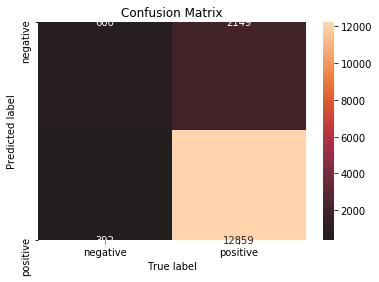

In [239]:
heatmap = sns.heatmap(heatmap_dataframe,annot=True,fmt='d',center=True,robust=True)
# Setting tick labels for heatmap
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.title("Confusion Matrix")
plt.show()

In [240]:
#prediction_probability_train[:,1]--considering only probabilities for positive class (As ROC is calculated only based on +ve)
fpr_train, tpr_train, threshold_train = roc_curve(train_data_labels, prediction_probability_train [:,1],pos_label='positive')
fpr_test, tpr_test, threshold_test = roc_curve(test_data_labels, prediction_probability_test[:,1],pos_label='positive')


In [247]:
print(f"The AUC value for train data is {roc_auc_score(train_data_labels, prediction_probability_train[:,1])}")

The AUC value for train data is 0.8303461174605469


In [242]:
#creating a dataframe for all fpr_train and tpr_train
roc_auc_train_df = pd.DataFrame(dict(fpr_train=fpr_train,tpr_train=tpr_train))
#creating a dataframe for all fpr_test and tpr_test
roc_auc_test_df = pd.DataFrame(dict(fpr_test=fpr_test,tpr_test=tpr_test))

In [243]:
train_roc = px.line(roc_auc_train_df,roc_auc_train_df.fpr_train,roc_auc_train_df.tpr_train,title="ROC curve for TRAIN data")
train_roc.data[0].update(mode="markers+lines")
train_roc

In [246]:
print(f"The AUC value for test data is {roc_auc_score(test_data_labels, prediction_probability_test[:,1])}")

The AUC value for test data is 0.7772476947661815


In [245]:
test_roc = px.line(roc_auc_test_df,roc_auc_test_df.fpr_test,roc_auc_test_df.tpr_test,title="ROC curve for TEST data")
test_roc.data[0].update(mode="markers+lines")
test_roc

# [6] Conclusions

In [248]:
from prettytable import PrettyTable
# reference : http://zetcode.com/python/prettytable/
pretty_table = PrettyTable()
pretty_table.field_names = ["vectorizer_type","Decision Tree","max_depth","min_samples_split","train_roc-auc","test_roc"]
pretty_table.add_row(["Bag of words","Decision Tree","50","500","0.88","0.85"])
pretty_table.add_row(["TF-IDF","Decision Tree","50","500","0.90","0.85"])
pretty_table.add_row(["AvgW2V","Decision Tree","10","500","0.85","0.80"])
pretty_table.add_row(["Tf_idfW2V","Decision Tree","10","500","0.83","0.77"])
print(pretty_table)


+-----------------+---------------+-----------+-------------------+---------------+----------+
| vectorizer_type | Decision Tree | max_depth | min_samples_split | train_roc-auc | test_roc |
+-----------------+---------------+-----------+-------------------+---------------+----------+
|   Bag of words  | Decision Tree |     50    |        500        |      0.88     |   0.85   |
|      TF-IDF     | Decision Tree |     50    |        500        |      0.90     |   0.85   |
|      AvgW2V     | Decision Tree |     10    |        500        |      0.85     |   0.80   |
|    Tf_idfW2V    | Decision Tree |     10    |        500        |      0.83     |   0.77   |
+-----------------+---------------+-----------+-------------------+---------------+----------+


1. Among all the NLP techniques, we have obtained good AUC for Bag_of_words. Even though, AUC is same for both tf-idf and BOW, the variation between test and train AUC's of BOW is much smaller.



2. Worst performed model out of all is Tf-idf Weighted Word2Vec. That might be because we have taken very small amount of subset and trained only on it and tried to get predictions on unseen data based on trained weights



3. Important features in data are  'disappoint', 'worst','great','return','wast','love','best','aw','delici','horribl'
